In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import glob
import os
import re
import pandas as pd
import tarfile
import P4J
from astropy.table import Table
from astropy.stats import sigma_clip
from multiprocessing import Pool

%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)
sns.set(style="white", color_codes=True, context="notebook", font_scale=1.4)

mainpath = '/Users/jorgetil/Astro/HITS'

In [2]:
def give_me_lc(field, CCD, X, Y, extract=False):
    year = field[:-3]
    try:
        tar = tarfile.open("%s/lightcurves/%s/%s/%s/%s_%s_LC_50.tar.gz" 
                           % (mainpath, year, field, CCD, field, CCD))
        fil = tar.extractfile('%s_%s_%s_%s_g.dat' % (field, CCD, X, Y))
        if extract:
            tar.extract('%s_%s_%s_%s_g.dat' % (field, CCD, X, Y),
                    path='/Users/jorgetil/Astro/HITS/lightcurves/samples/.')
    except:
        print 'No tar file or element in tar file'
        return None
    
    time, mag, err = [], [], []
    for line in fil:
        if line[0] == '#': continue
        values = line.split()
        time.append(float(values[1]))
        mag.append(float(values[2]))
        err.append(float(values[3]))
    time = np.asarray(time)
    mag= np.asarray(mag)
    err = np.asarray(err)
    
    try:
        fil = tar.extractfile('%s_%s_%s_%s_r.dat' % (field, CCD, X, Y))
        #tar.extract('%s_%s_%s_%s_r.dat' % (field, CCD, X, Y)
        #                , path='/Users/jorgetil/Downloads/.')
        time2, mag2, err2 = [], [], []
        for line in fil:
            if line[0] == '#': continue
            values = line.split()
            time2.append(float(values[1]))
            mag2.append(float(values[2]))
            err2.append(float(values[3]))
        time2 = np.asarray(time2)
        mag2 = np.asarray(mag2)
        err2 = np.asarray(err2)
        return time, mag, err, time2, mag2, err2
    except:
        print 'No lightcurve for other filter'
        return time, mag, err, None, None, None

In [3]:
# load feature table into DF
table_file = '%s/tables/Blind15A_SDSS_STARS_NV.csv' % (mainpath)
STARS_NV = pd.read_csv(table_file)
STARS_NV.set_index('internalID', inplace=True)

In [4]:
STARS_NV = STARS_NV.query('~(Var_Type=="CV" or Var_Type=="ZZ")')
STARS_NV.Var_Type.value_counts()

NV    137
Name: Var_Type, dtype: int64

In [5]:
table_file = '%s/tables/Blind15A_label_sample_pointlike_cleanphot.csv' % (mainpath)
labeled_data = pd.read_csv(table_file)
labeled_data.set_index('internalID', inplace=True)
qso_data = labeled_data.query('Var_Type == "QSO"')

In [64]:
table_file = '%s/tables/Blind15A_features_pointlike_cleanphot.csv'\
              %(mainpath)
target_set = pd.read_csv(table_file)
target_set = target_set.set_index('internalID')
#print target_set.info()

/Users/jorgetil/miniconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Remove S7 from everything

In [65]:
targe_idx = target_set.index.values
ccd_list_str_target = []
for idx in targe_idx:
    field, CCD, X, Y = re.findall(
            r'(\w+\d+\w?\_\d\d?)\_(\w\d+?)\_(\d+)\_(\d+)', idx)[0]
    ccd_list_str_target.append(CCD)
ccd_list_str_target = np.array(ccd_list_str_target)

In [66]:
s7_mask = ccd_list_str_target != 'S7'
print target_set.shape
print target_set[s7_mask].shape

(1812737, 74)
(1790405, 74)


In [67]:
out = '%s/tables/Blind15A_features_pointlike_cleanphot_cleanCCD.csv'\
              %(mainpath)
target_set[s7_mask].to_csv(out)

In [6]:
def return_lc(data):
    idx = data[0]
    k = data[1]
    print k, idx
    field, CCD, X, Y = re.findall(
            r'(\w+\d+\w?\_\d\d?)\_(\w\d+?)\_(\d+)\_(\d+)', idx)[0]
    time, mag, err, time2, mag2, err2 = give_me_lc(field, CCD, X, Y,extract=False)
    lc = [time,mag,err]
    return lc

In [14]:
all_idx_stars_nv = STARS_NV.index.values
all_idx_qso = qso_data.sort_values('Std',ascending=False).index.values

In [8]:
p = Pool(processes=3)

In [11]:
all_lcs_stars_nv = p.map(return_lc, zip(all_idx_stars_nv, range(len(all_idx_stars_nv))))

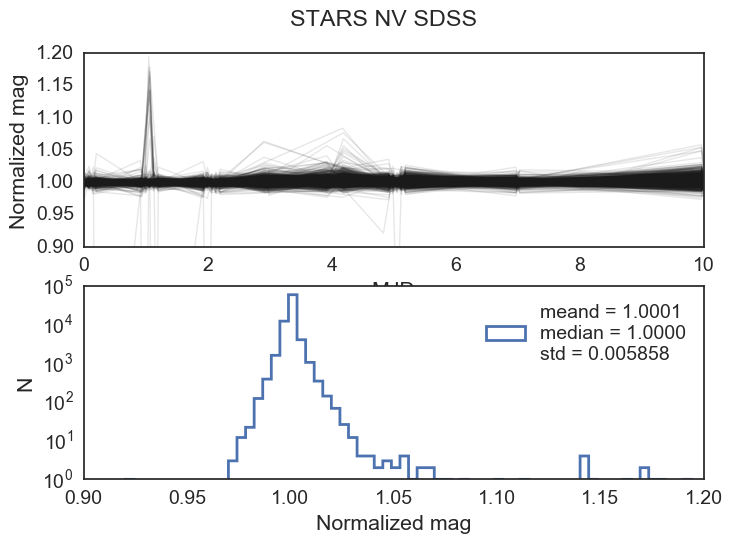

In [13]:
norm_mag = []
fig, ax = plt.subplots(2)
fig.suptitle("STARS NV SDSS", fontsize="medium")
for k, lc in enumerate(all_lcs_stars_nv): 
    ax[0].plot(lc[0]- np.min(lc[0]), lc[1]/np.median(lc[1]), 'k-', alpha=.1, lw=1)
    norm_mag.extend(lc[1]/np.median(lc[1]))
    
ax[0].set_ylim(.9,1.2)
ax[0].set_xlim(0,10)
ax[0].set_xlabel('MJD')
ax[0].set_ylabel('Normalized mag')
ax[1].hist(norm_mag, bins=200, histtype='step', lw=2,
           label='meand = %.4f\nmedian = %.4f\nstd = %.6f' %
           (np.mean(norm_mag), np.median(norm_mag),np.std(norm_mag)))
ax[1].legend(loc='best')
ax[1].set_yscale('log')
ax[1].set_xlim(.9,1.2)
ax[1].set_xlabel('Normalized mag')
ax[1].set_ylabel('N')
plt.show()

In [52]:
ccd_list_str = []
for idx in all_idx_stars_nv:
    field, CCD, X, Y = re.findall(
            r'(\w+\d+\w?\_\d\d?)\_(\w\d+?)\_(\d+)\_(\d+)', idx)[0]
    ccd_list_str.append(CCD)
ccd_list_str = np.array(ccd_list_str)

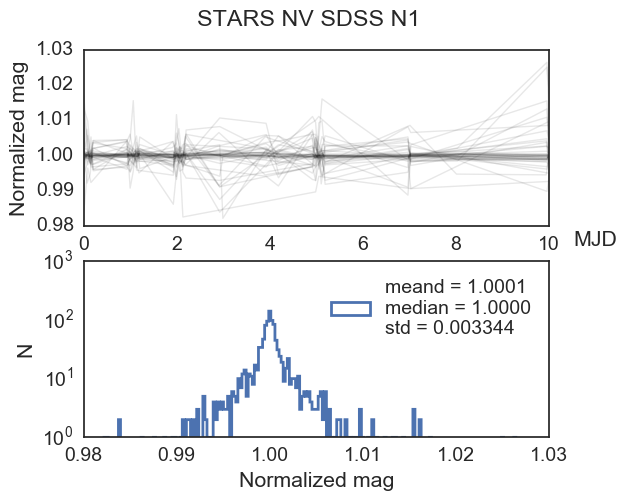

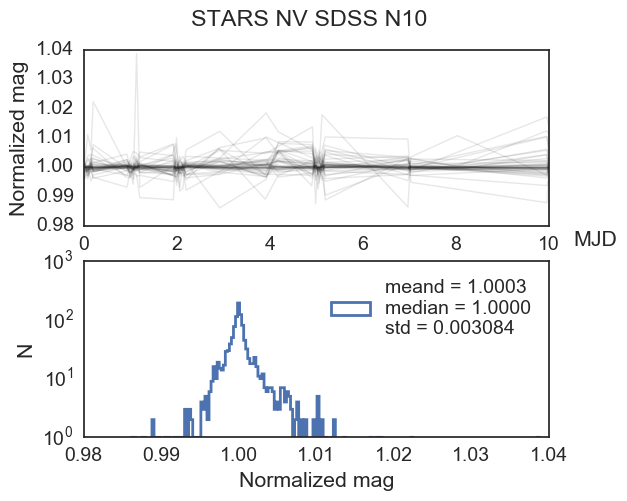

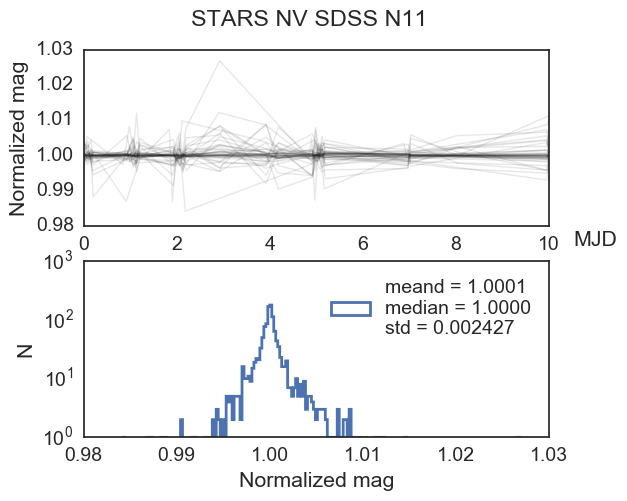

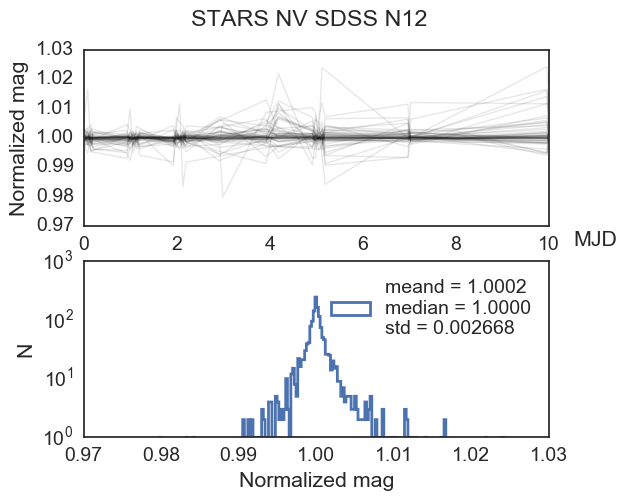

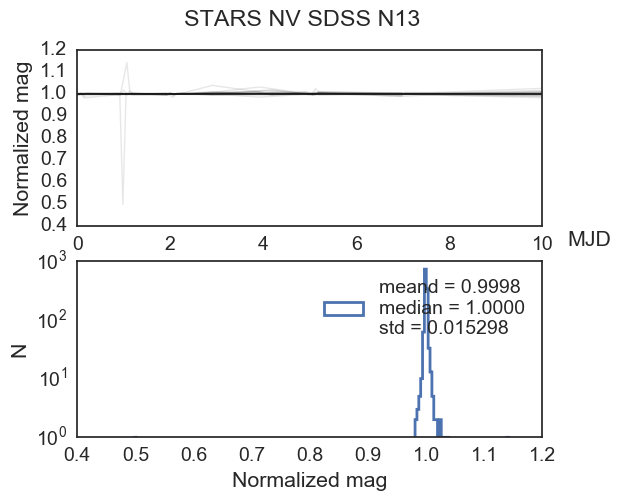

...

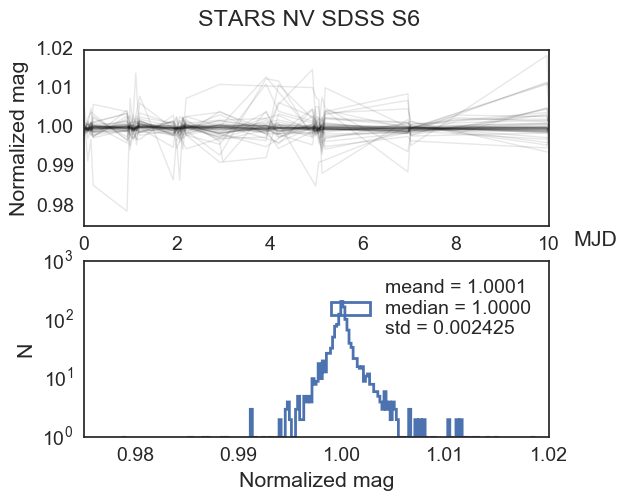

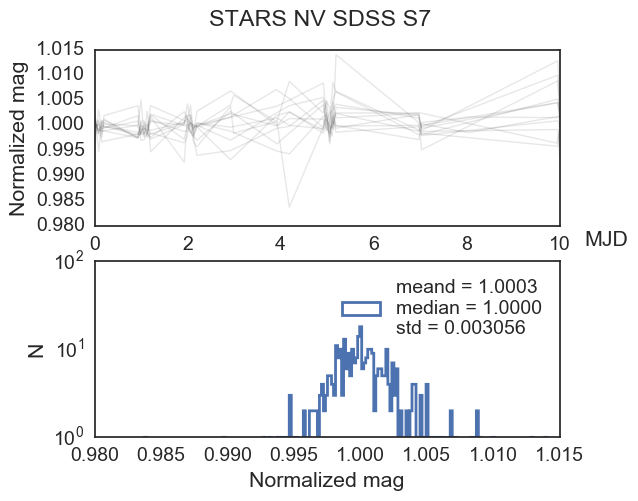

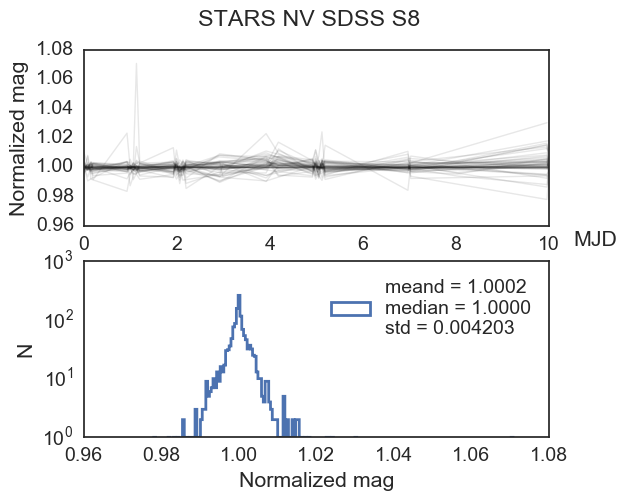

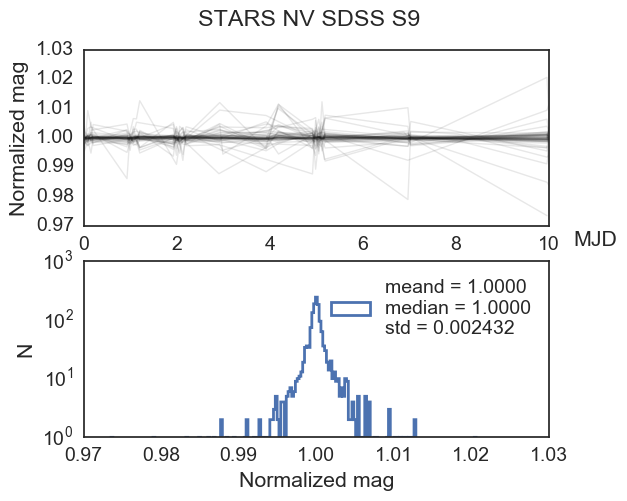

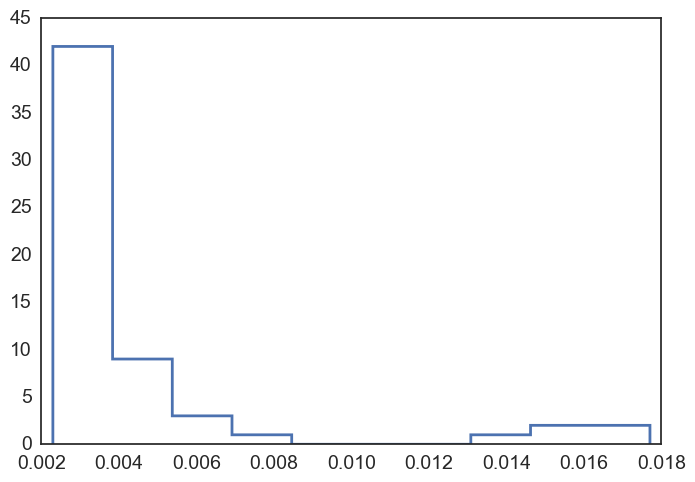

In [54]:
std_by_ccd = []
for ccd in sorted(set(ccd_list_str)): 
    norm_mag = []
    fig, ax = plt.subplots(2, figsize=(6,5))
    fig.suptitle("STARS NV SDSS %s" % (ccd), fontsize="medium")
    for k, lc in enumerate(all_lcs_stars_nv): 
        if ccd_list_str[k]!=ccd: continue 
        ax[0].plot(lc[0]- np.min(lc[0]), lc[1]/np.median(lc[1]), color, alpha=.1, lw=1)
        norm_mag.extend(lc[1]/np.median(lc[1]))

    #ax[0].set_ylim(.9,1.2)
    ax[0].set_xlim(0,10)
    ax[0].set_xlabel('MJD')
    ax[0].xaxis.set_label_coords(1.1, -.025)
    ax[0].set_ylabel('Normalized mag')
    ax[1].hist(norm_mag, bins=200, histtype='step', lw=2,
               label='meand = %.4f\nmedian = %.4f\nstd = %.6f' %
               (np.mean(norm_mag), np.median(norm_mag),np.std(norm_mag)))
    ax[1].legend(loc='best')
    ax[1].set_yscale('log')
    #ax[1].set_xlim(.9,1.2)
    ax[1].set_xlabel('Normalized mag')
    ax[1].set_ylabel('N')
    plt.show()
    std_by_ccd.append(np.std(norm_mag))
    #break
plt.hist(std_by_ccd, histtype='step', lw=2)
plt.show()

In [15]:
all_lcs_qso = p.map(return_lc, zip(all_idx_qso, range(len(all_idx_qso))))

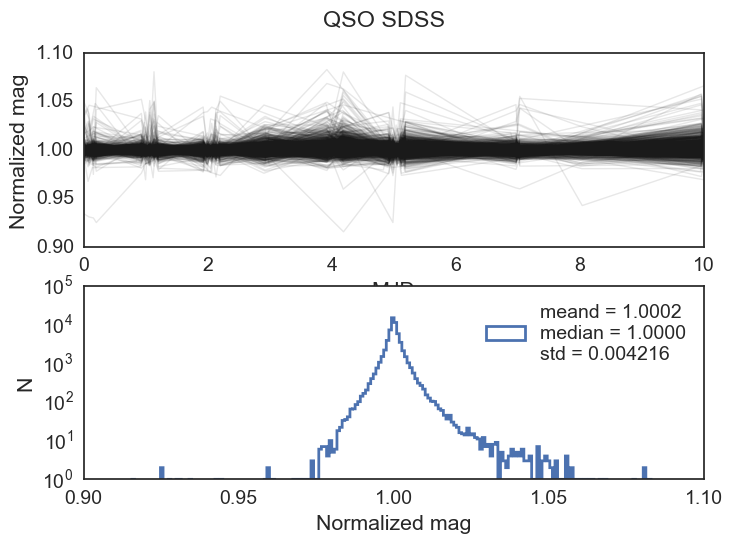

In [16]:
norm_mag = []
fig, ax = plt.subplots(2)
fig.suptitle("QSO SDSS", fontsize="medium")
for k, lc in enumerate(all_lcs_qso): 
    ax[0].plot(lc[0]- np.min(lc[0]), lc[1]/np.median(lc[1]), 'k-', alpha=.1, lw=1)
    norm_mag.extend(lc[1]/np.median(lc[1]))
    
#ax[0].set_ylim(.9,1.2)
ax[0].set_xlim(0,10)
ax[0].set_xlabel('MJD')
ax[0].set_ylabel('Normalized mag')
ax[1].hist(norm_mag, bins=200, histtype='step', lw=2,
           label='mean = %.4f\nmedian = %.4f\nstd = %.6f' %
           (np.mean(norm_mag), np.median(norm_mag),np.std(norm_mag)))
ax[1].legend(loc='best')
ax[1].set_yscale('log')
#ax[1].set_xlim(.9,1.2)
ax[1].set_xlabel('Normalized mag')
ax[1].set_ylabel('N')
plt.show()

In [51]:
ccd_list_qso = []
for idx in all_idx_qso:
    field, CCD, X, Y = re.findall(
            r'(\w+\d+\w?\_\d\d?)\_(\w\d+?)\_(\d+)\_(\d+)', idx)[0]
    ccd_list_qso.append(CCD)
ccd_list_qso = np.array(ccd_list_qso)

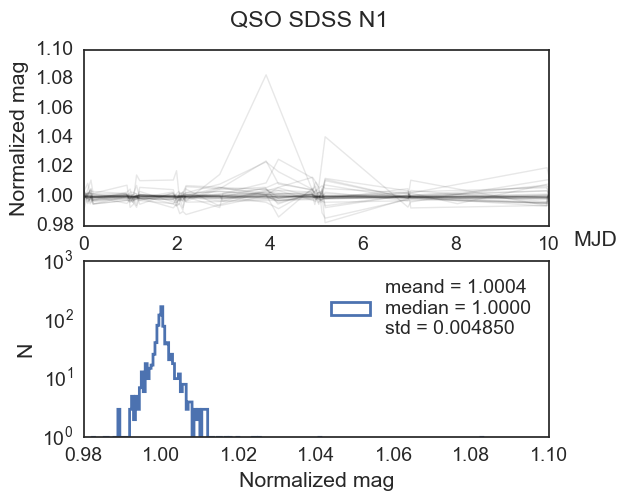

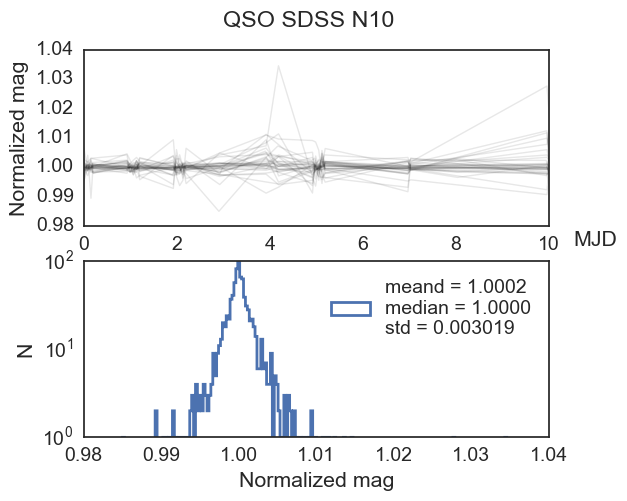

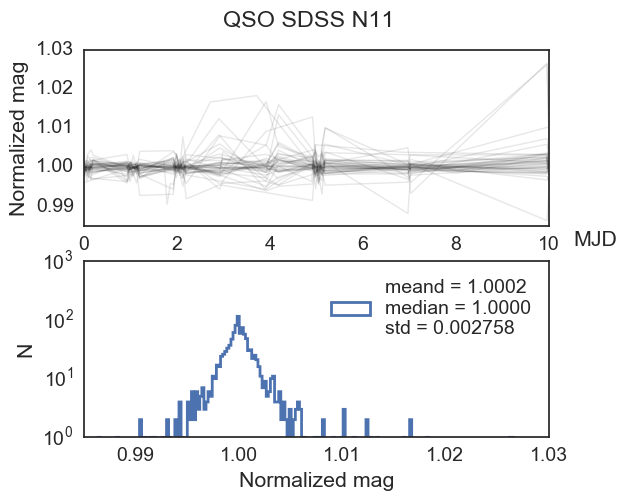

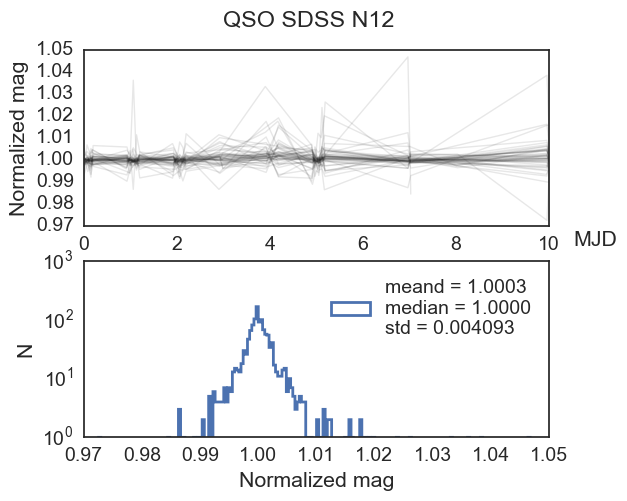

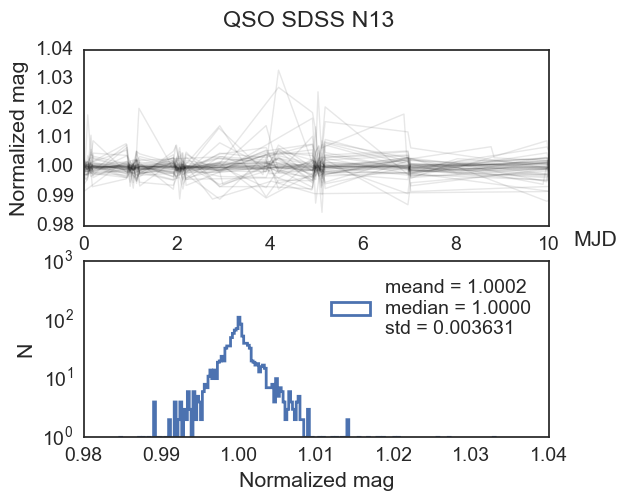

...

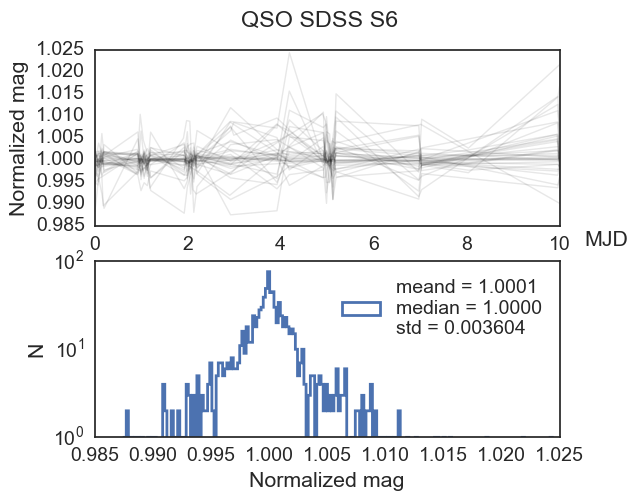

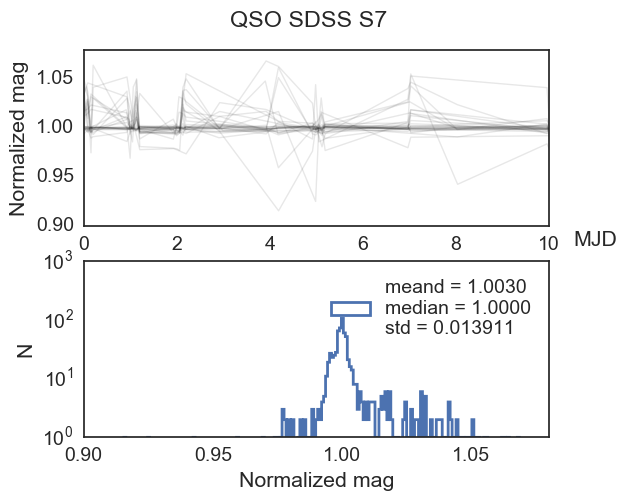

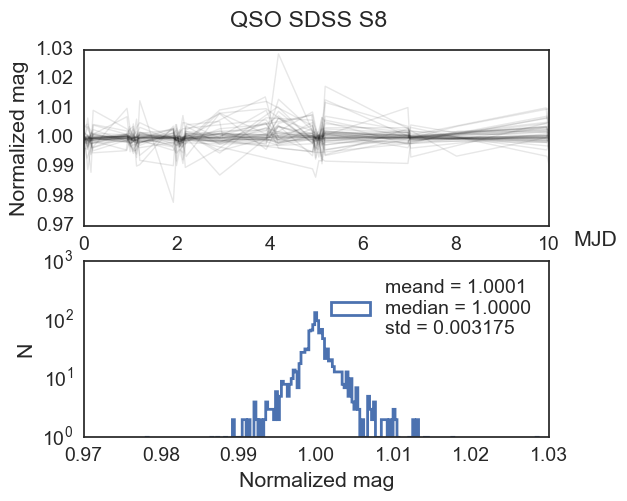

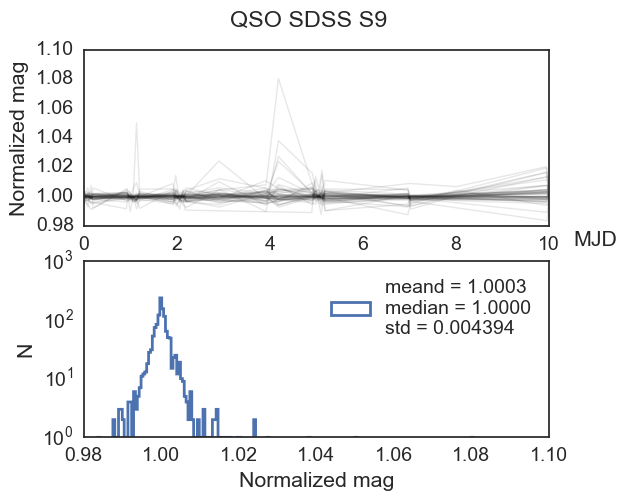

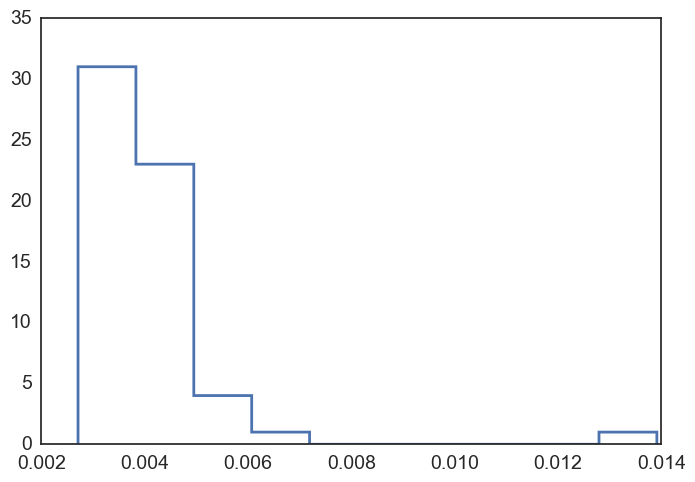

In [48]:
std_by_ccd = []
for ccd in sorted(set(ccd_list_qso)): 
    norm_mag = []
    fig, ax = plt.subplots(2, figsize=(6,5))
    fig.suptitle("QSO SDSS %s" % (ccd), fontsize="medium")
    for k, lc in enumerate(all_lcs_qso): 
        if ccd_list_qso[k]!=ccd: continue 
        ax[0].plot(lc[0]- np.min(lc[0]), lc[1]/np.median(lc[1]), color, alpha=.1, lw=1)
        norm_mag.extend(lc[1]/np.median(lc[1]))

    #ax[0].set_ylim(.9,1.2)
    ax[0].set_xlim(0,10)
    ax[0].set_xlabel('MJD')
    ax[0].xaxis.set_label_coords(1.1, -.025)
    ax[0].set_ylabel('Normalized mag')
    ax[1].hist(norm_mag, bins=200, histtype='step', lw=2,
               label='meand = %.4f\nmedian = %.4f\nstd = %.6f' %
               (np.mean(norm_mag), np.median(norm_mag),np.std(norm_mag)))
    ax[1].legend(loc='best')
    ax[1].set_yscale('log')
    #ax[1].set_xlim(.9,1.2)
    ax[1].set_xlabel('Normalized mag')
    ax[1].set_ylabel('N')
    plt.show()
    std_by_ccd.append(np.std(norm_mag))
    #break
plt.hist(std_by_ccd, histtype='step', lw=2)
plt.show()